**Libraries**

In [8]:
#this is what youre supposed to install
# Install all required libraries
#install ultralytics  # For YOLOv8
#install easyocr      # For license plate reading
#install opencv-python-headless  # OpenCV for Colab
#install easyocr
#!pip install -q roboflow ultralytics

In [2]:
# Import all necessary libraries
import torch
import cv2
import easyocr
from ultralytics import YOLO
import numpy as np
import matplotlib.pyplot as plt
#from google.colab.patches import cv2_imshow  # Special for Colab
#from google.colab import files
import os


**Switching to GPU**

In [10]:
#for collab
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
#print(f"Using device {device}")

#if device == 'cuda':
#  print(f"GPU: {torch.cuda.get_device_name(0)}")
#  print("GPU acceleration enabled")

In [27]:
'''
# for local gpu (you gotta have torch for this)
# i ran:
# pip uninstall torch torchvision torchaudio -y
# pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
# but then had to install a different version that works with my 5070ti
import torch

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Compute capability: {torch.cuda.get_device_capability(0)}")
    
    # Test actual computation
    x = torch.randn(1000, 1000).cuda()
    y = torch.randn(1000, 1000).cuda()
    z = x @ y
    print("✓ GPU computation successful!")
else:
    print("❌ Still no CUDA")
'''

'\n# for local gpu (you gotta have torch for this)\n# i ran:\n# pip uninstall torch torchvision torchaudio -y\n# pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121\n# but then had to install a different version that works with my 5070ti\nimport torch\n\nprint(f"PyTorch version: {torch.__version__}")\nprint(f"CUDA available: {torch.cuda.is_available()}")\n\nif torch.cuda.is_available():\n    print(f"GPU: {torch.cuda.get_device_name(0)}")\n    print(f"Compute capability: {torch.cuda.get_device_capability(0)}")\n    \n    # Test actual computation\n    x = torch.randn(1000, 1000).cuda()\n    y = torch.randn(1000, 1000).cuda()\n    z = x @ y\n    print("✓ GPU computation successful!")\nelse:\n    print("❌ Still no CUDA")\n'

unforunately, cuda doesnt work on this gpu for this already (i think) so we gonna have to switch back to da cpu

In [12]:
#also this are the folders youre supposed to make on collab
# Create folders for organization
#!mkdir -p data/train/images
#!mkdir -p data/train/labels
#!mkdir -p data/val/images
#!mkdir -p data/val/labels
#!mkdir -p data/test
#!mkdir -p models
#!mkdir -p outputs

#print("✓ Project folders created!")


In [13]:
#installing mock to monkeypatch the broken dependencies we need for roboflow
import sys
from unittest.mock import MagicMock

# Fake the broken modules
sys.modules['pi_heif'] = MagicMock()
sys.modules['pillow_avif'] = MagicMock()

sys.modules['filetype'] = MagicMock()


In [14]:
# Colab cell 2: securely set API key and download dataset from getpass
from getpass import getpass
import os
from roboflow import Roboflow

In [15]:
ROBOFLOW_API_KEY = "QhtRA8IrNqloDeH6MRTZ"
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

In [16]:
workspace_name = "helmet-wparg"
project_name = "helmet-detection-0xjjk-qsh2v"
version_number = 1
export_format = "yolov8" # use "yolov8" or "yolov5" depending on Roboflow support



In [17]:
project = rf.workspace(workspace_name).project(project_name)
version = project.version(version_number)
dataset = version.download(export_format)
# Print where files were extracted
try: print("Dataset extracted to:", dataset.location)
except Exception:
  import glob
  print("Top-level folders in /content:", glob.glob("/content/*")[:50])



loading Roboflow workspace...
loading Roboflow project...
Dataset extracted to: c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\Helmet-detection-1


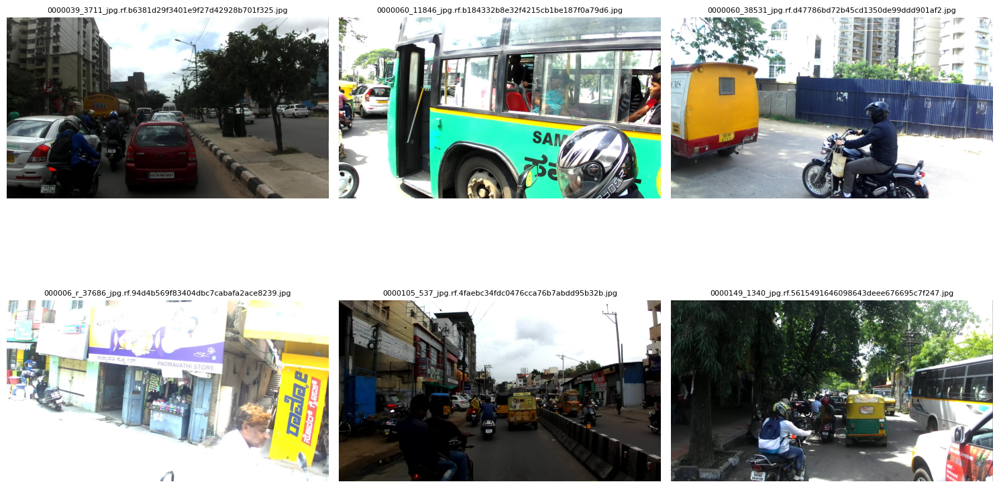

✓ Sample images displayed


In [18]:
# View first 6 training images
image_dir = f'Helmet-detection-1/train/images'
image_files = os.listdir(image_dir)[:6]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for idx, img_name in enumerate(image_files):
    img_path = os.path.join(image_dir, img_name)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(img_rgb)
    axes[idx].axis('off')
    axes[idx].set_title(img_name, fontsize=8)

plt.tight_layout()
plt.show()

print("✓ Sample images displayed")

In [19]:
# Read a sample label file
label_dir = f'Helmet-detection-1/train/labels'
label_files = os.listdir(label_dir)

# Read first label
sample_label = os.path.join(label_dir, label_files[0])
print(f"Sample label file: {label_files[0]}")
print("\nContents:")
with open(sample_label, 'r') as f:
    print(f.read())

Sample label file: 0000039_3711_jpg.rf.b6381d29f3401e9f27d42928b701f325.txt

Contents:
0 0.26424258198854766 0.5249814814814815 0.01760541384695471 0.032157407407407405
0 0.244711087975013 0.5257222222222222 0.017438833940655908 0.029648148148148153
0 0.2022956793336804 0.5877129629629629 0.05153565851119209 0.09641666666666666
0 0.3322071837584591 0.5388240740740741 0.02786569495054659 0.05053703703703703
0 0.4192764185320145 0.521712962962963 0.011405517959396148 0.017018518518518516
0 0.46374284226965123 0.5160185185185184 0.008162415408641332 0.013888888888888888
0 0.699677251431546 0.5099444444444444 0.007173347214992192 0.017574074074074075
0 0.49722540343571053 0.624175925925926 0.002831858407079646 0.0007962962962962962
0 0.46935450286309216 0.5142314814814815 0.004966163456533055 0.008796296296296297
0 0.47905257678292557 0.5148518518518518 0.00644456012493493 0.006740740740740741
0 0.39680895366996355 0.512 0.0062103071317022385 0.00900925925925926


**Dataset size count**

In [20]:
#for collab:
# counts
#!echo "Train images:" $(ls ! 2>/dev/null | wc -l)
#!echo "Train labels:" $(ls /content/Helmet-detection-1/train/labels 2>/dev/null | wc -l)
#!echo "Val images:" $(ls /content/Helmet-detection-1/valid/images 2>/dev/null | wc -l)
#!echo "Val labels:" $(ls /content/Helmet-detection-1/valid/labels 2>/dev/null | wc -l)
#!echo "Test images:" $(ls /content/Helmet-detection-1/test/images 2>/dev/null | wc -l)

# Check dataset counts
dataset_path = 'Helmet-detection-1'  # Update this path!

print("Train images:", len(os.listdir(f'{dataset_path}/train/images')))
print("Train labels:", len(os.listdir(f'{dataset_path}/train/labels')))
print("Val images:", len(os.listdir(f'{dataset_path}/valid/images')))
print("Val labels:", len(os.listdir(f'{dataset_path}/valid/labels')))
print("Test images:", len(os.listdir(f'{dataset_path}/test/images')))

Train images: 351
Train labels: 351
Val images: 100
Val labels: 100
Test images: 51


**Check if YOLO object recognition is working**

Testing detection on: Helmet-detection-1/valid/images/0000060_37809_jpg.rf.aa50c9cca9997a5f6766bd878966d9cc.jpg

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\Helmet-detection-1\valid\images\0000060_37809_jpg.rf.aa50c9cca9997a5f6766bd878966d9cc.jpg: 384x640 2 persons, 61.0ms
Speed: 7.6ms preprocess, 61.0ms inference, 14.8ms postprocess per image at shape (1, 3, 384, 640)


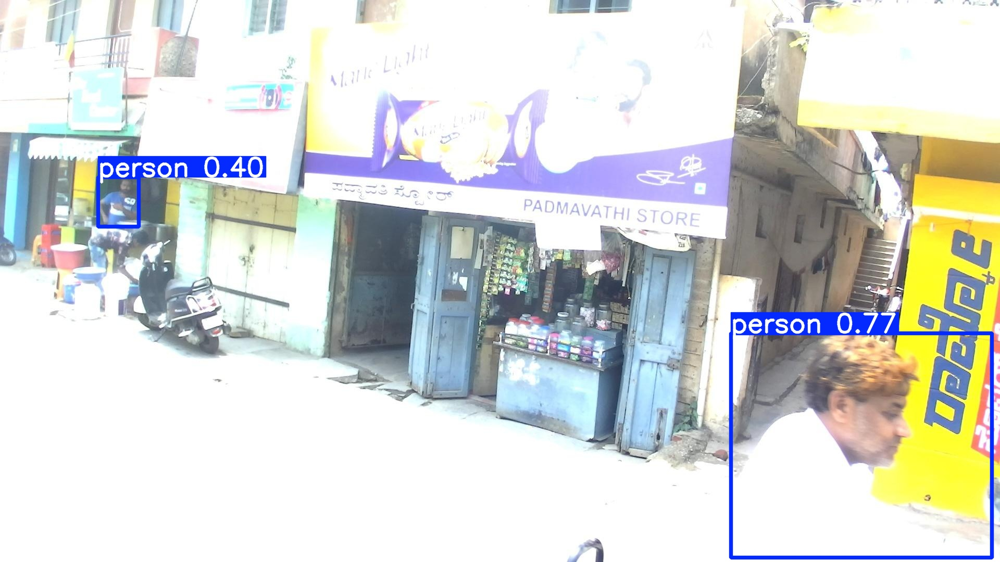

✓ YOLOv8 working correctly!


In [29]:

# Load pre-trained YOLOv8 model
model = YOLO('yolov8n.pt')

# Get a sample image path
sample_image = f'Helmet-detection-1/valid/images/{os.listdir(f"Helmet-detection-1/valid/images")[0]}'

print(f"Testing detection on: {sample_image}")

# Run detection
results = model(sample_image, device='cpu')

# Display result
from IPython.display import Image, display
results[0].save('test_detection.jpg')
display(Image('test_detection.jpg'))

print("✓ YOLOv8 working correctly!")

**Check if labels are right**

Image: Helmet-detection-1/train/images/0000039_3711_jpg.rf.b6381d29f3401e9f27d42928b701f325.jpg
Label: Helmet-detection-1/train/labels/0000039_3711_jpg.rf.b6381d29f3401e9f27d42928b701f325.txt


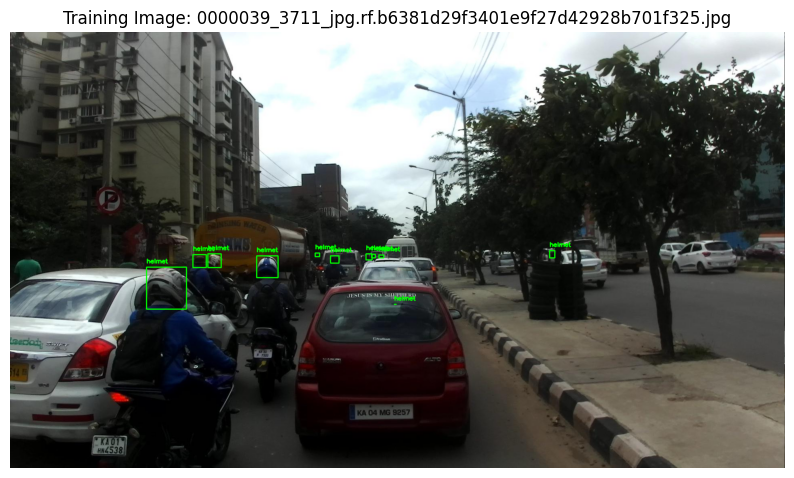

✓ Visualization complete!


In [22]:
import cv2
import matplotlib.pyplot as plt
import os

def visualize_yolo_annotation(image_path, label_path):
    """Display image with YOLO annotations"""

    # Read image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    # Read labels
    with open(label_path, 'r') as f:
        labels = f.readlines()

    # Class names (adjust if your dataset has different classes)
    class_names = ['helmet', 'no-helmet']
    colors = [(0, 255, 0), (255, 0, 0)]  # Green for helmet, Red for no-helmet

    # Draw each bounding box
    for label in labels:
        parts = label.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:5])

        # Convert normalized coordinates to pixels
        x_center = int(x_center * w)
        y_center = int(y_center * h)
        box_width = int(width * w)
        box_height = int(height * h)

        # Calculate top-left corner
        x1 = int(x_center - box_width / 2)
        y1 = int(y_center - box_height / 2)
        x2 = int(x_center + box_width / 2)
        y2 = int(y_center + box_height / 2)

        # Draw rectangle
        color = colors[class_id]
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), color, 2)

        # Add label
        label_text = class_names[class_id]
        cv2.putText(img_rgb, label_text, (x1, y1-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    return img_rgb

# Get first image from training set
img_name = os.listdir('Helmet-detection-1/train/images')[0]
label_name = img_name.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt')

image_path = f'Helmet-detection-1/train/images/{img_name}'
label_path = f'Helmet-detection-1/train/labels/{label_name}'

print(f"Image: {image_path}")
print(f"Label: {label_path}")

# Visualize
annotated_img = visualize_yolo_annotation(image_path, label_path)

plt.figure(figsize=(10, 8))
plt.imshow(annotated_img)
plt.axis('off')
plt.title(f'Training Image: {img_name}')
plt.show()

print("✓ Visualization complete!")

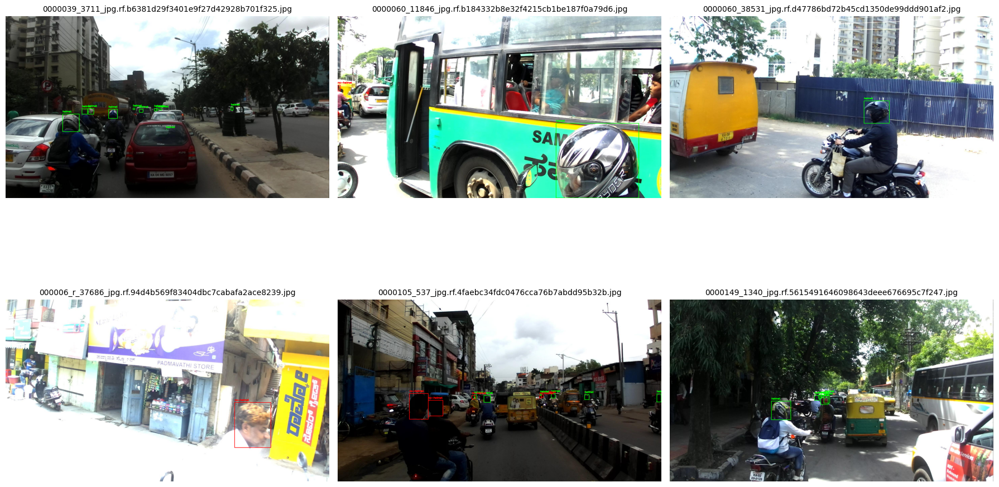

✓ Displayed 6 annotated training images


In [23]:
# Visualize first 6 training images with annotations
image_dir = 'Helmet-detection-1/train/images'
label_dir = 'Helmet-detection-1/train/labels'

image_files = os.listdir(image_dir)[:6]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for idx, img_name in enumerate(image_files):
    label_name = img_name.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt')

    image_path = os.path.join(image_dir, img_name)
    label_path = os.path.join(label_dir, label_name)

    # Visualize
    annotated_img = visualize_yolo_annotation(image_path, label_path)

    axes[idx].imshow(annotated_img)
    axes[idx].axis('off')
    axes[idx].set_title(img_name, fontsize=10)

plt.tight_layout()
plt.show()

print("✓ Displayed 6 annotated training images")

<h3>Training the model</h3>

In [31]:
# Load a pre-trained model
model = YOLO('yolov8n.pt')  # nano (smallest/fastest)

# Train the model on your helmet dataset
results = model.train(
    data='Helmet-detection-1/data.yaml',
    epochs=50,              # Number of training iterations
    imgsz=640,              # Image size
    batch=16,               # Batch size
    name='helmet_detector',  # Name for this training run
    patience=10,             # Early stopping if no improvement
    device='cpu'            #we gotta switch to da cpu
)

print("✓ Training complete!")
print(f"Results saved to: runs/detect/helmet_detector")

Ultralytics 8.4.3  Python-3.10.11 torch-2.9.1+cu126 CPU (AMD Ryzen 9 8940HX with Radeon Graphics)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Helmet-detection-1/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=helmet_detector7, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, pe

<h3>Test model</h3>

📊 TRAINING RESULTS

1️⃣ Training Curves:


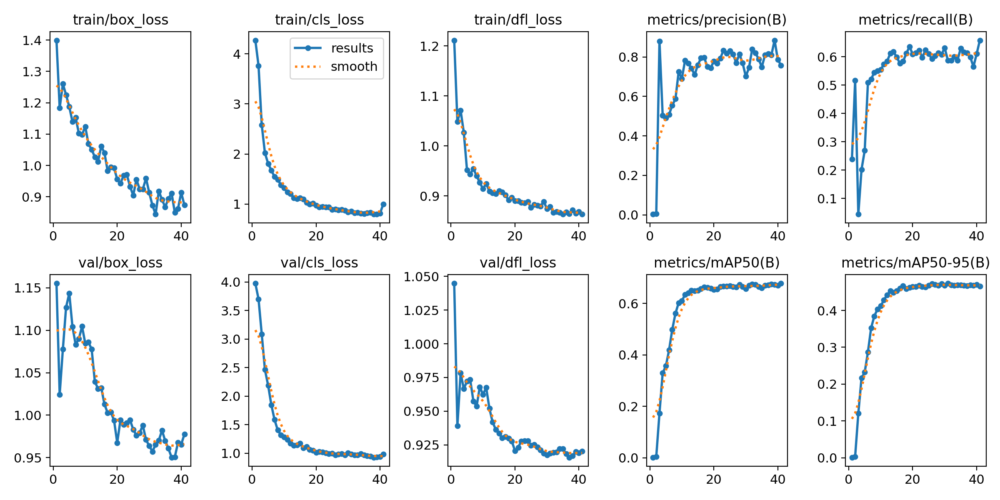


2️⃣ Confusion Matrix:


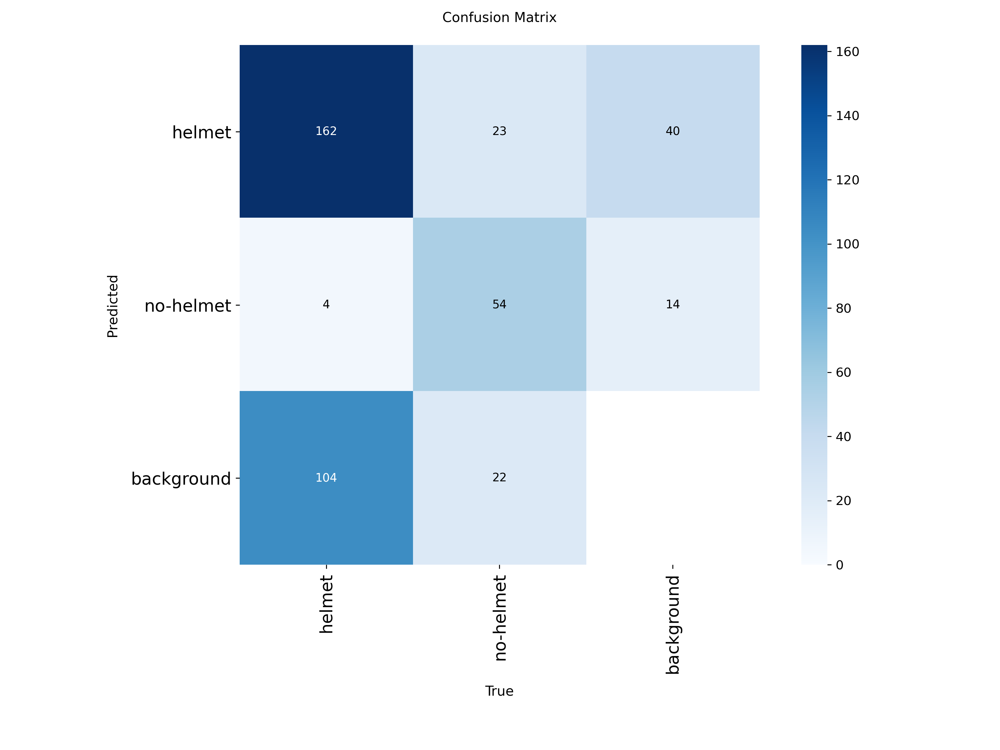


3️⃣ Sample Predictions:


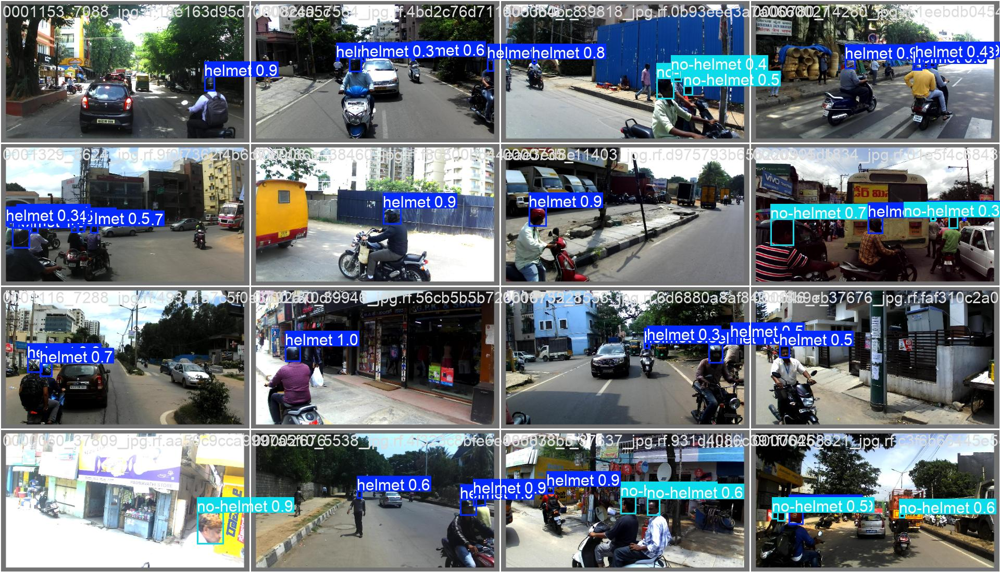


4️⃣ PR Curve:
❌ PR curve not found

5️⃣ F1 Curve:
❌ F1 curve not found

✅ Best model saved at: runs/detect/helmet_detector7/weights/best.pt
✅ Last model saved at: runs/detect/helmet_detector7/weights/last.pt


In [34]:
from IPython.display import Image, display
import os

results_dir = 'runs/detect/helmet_detector7'

print("📊 TRAINING RESULTS\n")

# 1. Training curves (loss, accuracy over time)
print("1️⃣ Training Curves:")
if os.path.exists(f'{results_dir}/results.png'):
    display(Image(f'{results_dir}/results.png'))
else:
    print("❌ Results plot not found")

# 2. Confusion matrix (how well it classifies)
print("\n2️⃣ Confusion Matrix:")
if os.path.exists(f'{results_dir}/confusion_matrix.png'):
    display(Image(f'{results_dir}/confusion_matrix.png'))
else:
    print("❌ Confusion matrix not found")

# 3. Sample predictions on validation set
print("\n3️⃣ Sample Predictions:")
if os.path.exists(f'{results_dir}/val_batch0_pred.jpg'):
    display(Image(f'{results_dir}/val_batch0_pred.jpg'))
else:
    print("❌ Validation predictions not found")

# 4. PR curve (Precision-Recall)
print("\n4️⃣ PR Curve:")
if os.path.exists(f'{results_dir}/PR_curve.png'):
    display(Image(f'{results_dir}/PR_curve.png'))
else:
    print("❌ PR curve not found")

# 5. F1 curve
print("\n5️⃣ F1 Curve:")
if os.path.exists(f'{results_dir}/F1_curve.png'):
    display(Image(f'{results_dir}/F1_curve.png'))
else:
    print("❌ F1 curve not found")

print(f"\n✅ Best model saved at: {results_dir}/weights/best.pt")
print(f"✅ Last model saved at: {results_dir}/weights/last.pt")

<h1>Plate recognition</h1>

<h3>Load the dataset</h3>

In [35]:
rf = Roboflow(api_key="sIkOXmHC4wN516IWw8mE")
project = rf.workspace("workspace-ikb1n").project("bike-number-plate-3yvst-lllcl")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to bike-number-plate-1 in yolov8:: 100%|██████████| 1252/1252 [00:01<00:00, 895.94it/s]


<h3>Examine dataset structure</h3>

In [38]:
dataset_path = 'bike-number-plate-1'

print("📁 Dataset Structure:")
!ls {dataset_path}

print("\n📊 Dataset Statistics:")
train_imgs = len(os.listdir(f'{dataset_path}/train/images'))
valid_imgs = len(os.listdir(f'{dataset_path}/valid/images'))
test_imgs = len(os.listdir(f'{dataset_path}/test/images'))

print(f"Training images: {train_imgs}")
print(f"Validation images: {valid_imgs}")
print(f"Test images: {test_imgs}")
print(f"Total: {train_imgs + valid_imgs + test_imgs}")

# Check data.yaml
print("\n📄 data.yaml contents:")
!cat {dataset_path}/data.yaml

📁 Dataset Structure:

📊 Dataset Statistics:
Training images: 465
Validation images: 124
Test images: 31
Total: 620

📄 data.yaml contents:


'ls' is not recognized as an internal or external command,
operable program or batch file.
'cat' is not recognized as an internal or external command,
operable program or batch file.


<h3>View dataset and annotations</h3>

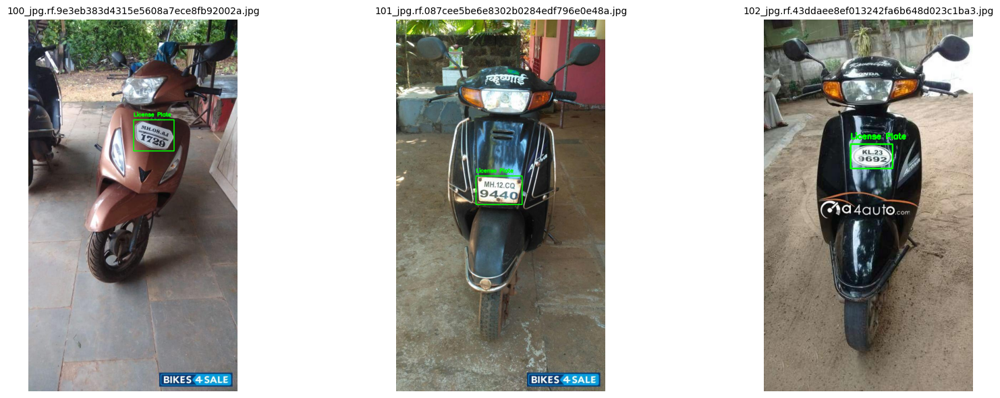

✓ Annotated images displayed


In [39]:
def visualize_plate_annotation(image_path, label_path):
    """Display image with license plate bounding box"""

    # Read image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    # Read label
    with open(label_path, 'r') as f:
        labels = f.readlines()

    # Draw bounding boxes
    for label in labels:
        parts = label.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:5])

        # Convert to pixel coordinates
        x_center = int(x_center * w)
        y_center = int(y_center * h)
        box_width = int(width * w)
        box_height = int(height * h)

        x1 = int(x_center - box_width / 2)
        y1 = int(y_center - box_height / 2)
        x2 = int(x_center + box_width / 2)
        y2 = int(y_center + box_height / 2)

        # Draw
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_rgb, 'License Plate', (x1, y1-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    return img_rgb

# Visualize first 3 images with annotations
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx in range(3):
    img_name = os.listdir(f'{dataset_path}/train/images')[idx]
    label_name = img_name.replace('.jpg', '.txt').replace('.png', '.txt')

    img_path = f'{dataset_path}/train/images/{img_name}'
    label_path = f'{dataset_path}/train/labels/{label_name}'

    annotated = visualize_plate_annotation(img_path, label_path)

    axes[idx].imshow(annotated)
    axes[idx].axis('off')
    axes[idx].set_title(img_name, fontsize=10)

plt.tight_layout()
plt.show()

print("✓ Annotated images displayed")

<h2>Train model for plate recognition</h2>

In [ ]:
from ultralytics import YOLO
import torch

# Check device
#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device =  'cpu'
print(f"Using device: {device}")

# Load pre-trained YOLO
model = YOLO('yolov8n.pt')

print("\n🚀 Starting plate detection training...")

# Train
results = model.train(
    data='bike-number-plate-1/data.yaml',  # Path to your data.yaml
    epochs=50,
    imgsz=640,
    batch=16 if device == 'cuda' else 8,  # Smaller batch for CPU
    name='plate_detector',
    patience=10,
    device=device,
    save=True,
    plots=True
)

print("\n✓ Plate detection model trained!")
print(f"Model saved to: runs\detect\plate_detector3\weights\best.pt")

Using device: cpu

🚀 Starting plate detection training...
New https://pypi.org/project/ultralytics/8.4.5 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.3  Python-3.10.11 torch-2.9.1+cu126 CPU (AMD Ryzen 9 8940HX with Radeon Graphics)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=bike-number-plate-1/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum

<h2>Examine model performance</h2>

📊 PLATE DETECTION TRAINING RESULTS


Training Curves:


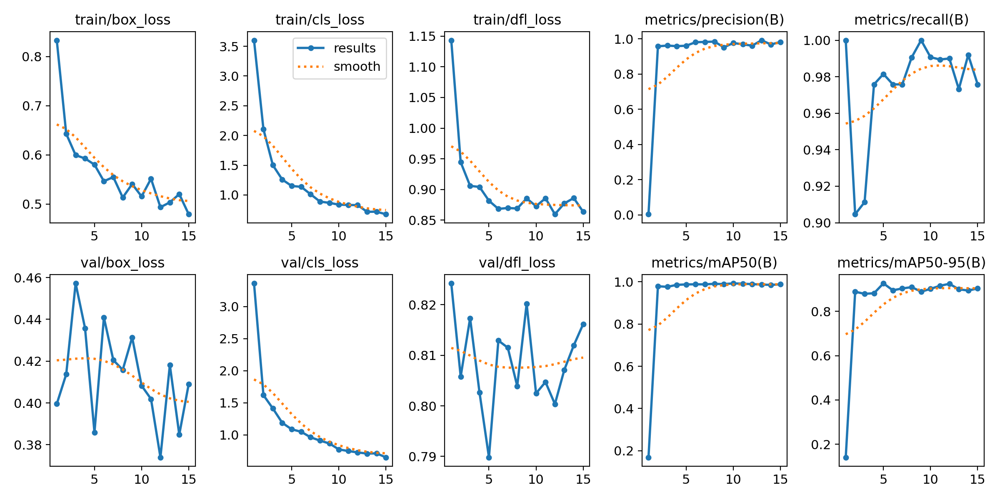


Confusion Matrix:


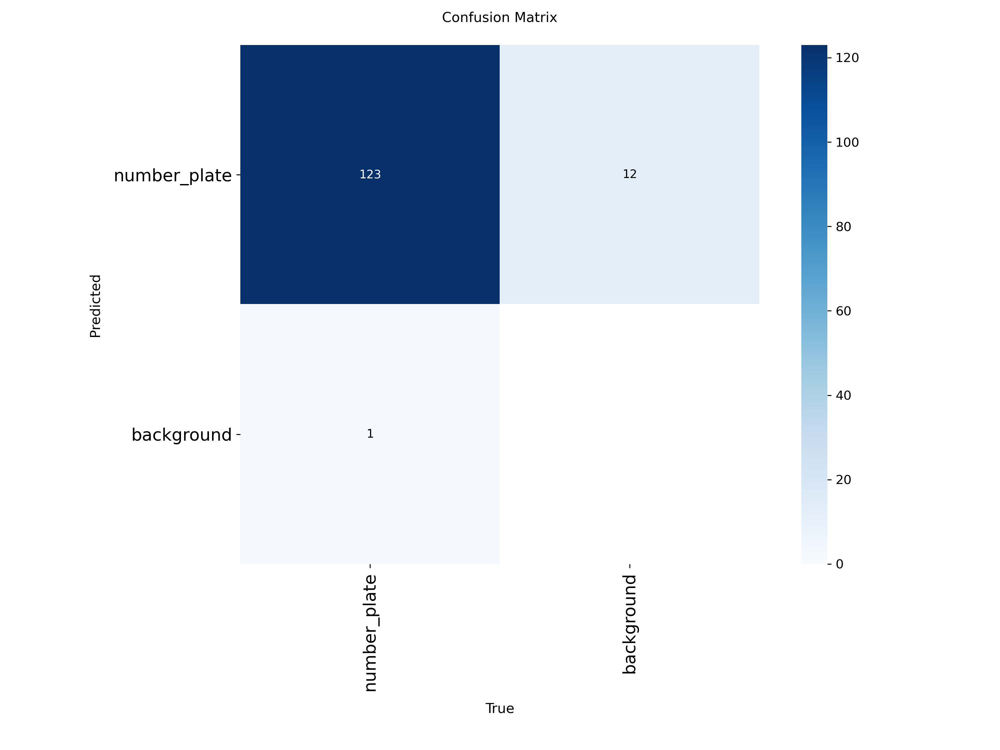


❌ F1 Curve not found

❌ PR Curve not found

Validation Predictions:


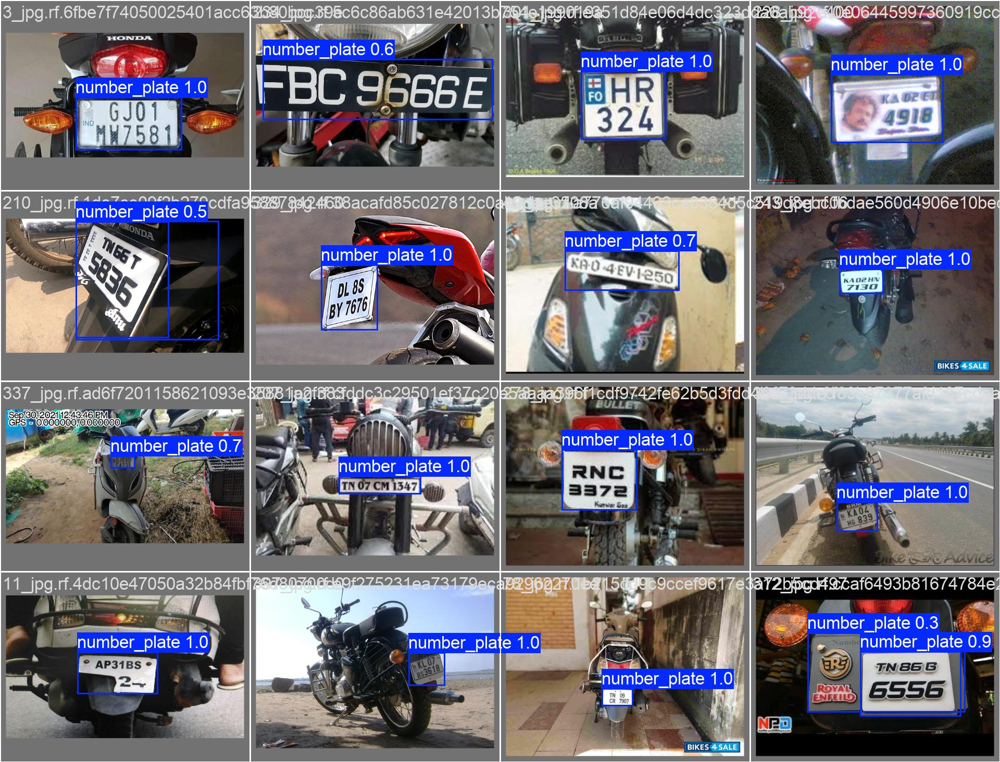


✅ Best model: runs/detect/plate_detector3/weights/best.pt


In [48]:
from IPython.display import Image, display
import matplotlib.pyplot as plt

results_dir = 'runs/detect/plate_detector3'

# List of images to display
images = [
    ('Training Curves', 'results.png'),
    ('Confusion Matrix', 'confusion_matrix.png'),
    ('F1 Curve', 'F1_curve.png'),
    ('PR Curve', 'PR_curve.png'),
    ('Validation Predictions', 'val_batch0_pred.jpg'),
]

print("📊 PLATE DETECTION TRAINING RESULTS\n")

for title, filename in images:
    filepath = f'{results_dir}/{filename}'
    if os.path.exists(filepath):
        print(f"\n{title}:")
        display(Image(filepath))
    else:
        print(f"\n❌ {title} not found")

print(f"\n✅ Best model: {results_dir}/weights/best.pt")

<h2>Train OCR for reading plates</h2>

In [59]:
# Load your trained plate detector - FORCE CPU
plate_model = YOLO('runs/detect/plate_detector3/weights/best.pt')

import easyocr
import cv2

# Initialize OCR reader
reader = easyocr.Reader(['en'], gpu=False)

# Function to detect plate AND read text
def detect_and_read_plate(image_path):
    # Step 1: Detect plate location - FORCE CPU
    results = plate_model(image_path, device='cpu')  # ← ADD THIS
    
    # Step 2: For each detected plate
    img = cv2.imread(image_path)
    
    for r in results:
        boxes = r.boxes
        for box in boxes:
            # Get plate coordinates
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            
            # Crop plate region
            plate_img = img[y1:y2, x1:x2]
            
            # Step 3: Read text with OCR
            ocr_result = reader.readtext(plate_img)
            
            # Extract text
            if ocr_result:
                plate_text = ocr_result[0][1]  # Get the text
                confidence = ocr_result[0][2]   # Get confidence
                
                print(f"Plate detected: {plate_text}")
                print(f"Confidence: {confidence:.2f}")
                
                return plate_text, confidence
    
    return None, None

# Test it
plate_text, conf = detect_and_read_plate('bike-number-plate-1/train/images/6_jpg.rf.7a8c1b68b0b63765c5799ffc595140c8.jpg')

Using CPU. Note: This module is much faster with a GPU.



image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\bike-number-plate-1\train\images\6_jpg.rf.7a8c1b68b0b63765c5799ffc595140c8.jpg: 480x640 1 number_plate, 89.4ms
Speed: 4.9ms preprocess, 89.4ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


In [60]:
print(f"Plate text: {plate_text}")
print(f"Confidence: {conf}")

Plate text: None
Confidence: None


<h2>its seeing nun</h2>


image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\bike-number-plate-1\train\images\6_jpg.rf.7a8c1b68b0b63765c5799ffc595140c8.jpg: 480x640 1 number_plate, 92.0ms
Speed: 9.5ms preprocess, 92.0ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


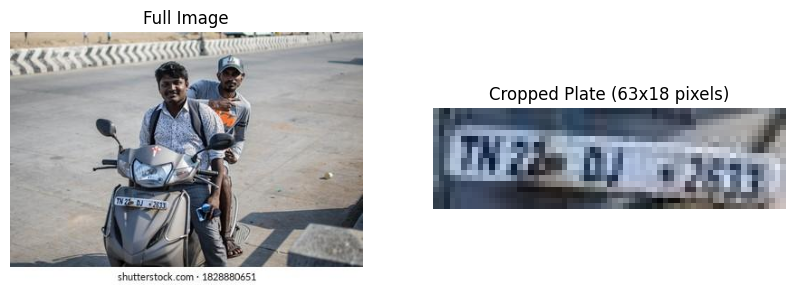

Plate size: 63x18 pixels

✗ OCR FAILED - Couldn't read anything
Trying with preprocessing...


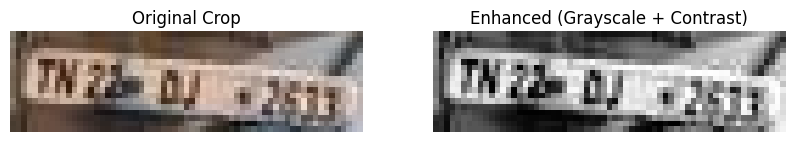


✗ Still couldn't read it


In [61]:
def debug_plate_detection(image_path):
    # Detect plate
    results = plate_model(image_path, device='cpu')
    img = cv2.imread(image_path)
    
    for r in results:
        boxes = r.boxes
        for box in boxes:
            # Crop plate
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            plate_img = img[y1:y2, x1:x2]
            
            # Show what we're trying to read
            plt.figure(figsize=(10, 4))
            
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title('Full Image')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(plate_img, cv2.COLOR_BGR2RGB))
            plt.title(f'Cropped Plate ({plate_img.shape[1]}x{plate_img.shape[0]} pixels)')
            plt.axis('off')
            
            plt.show()
            
            print(f"Plate size: {plate_img.shape[1]}x{plate_img.shape[0]} pixels")
            
            # Try OCR
            ocr_result = reader.readtext(plate_img)
            
            if ocr_result:
                print(f"\n✓ OCR SUCCESS!")
                for detection in ocr_result:
                    text = detection[1]
                    conf = detection[2]
                    print(f"  Text: {text}")
                    print(f"  Confidence: {conf:.2f}")
            else:
                print(f"\n✗ OCR FAILED - Couldn't read anything")
                print("Trying with preprocessing...")
                
                # Enhance the image
                gray = cv2.cvtColor(plate_img, cv2.COLOR_BGR2GRAY)
                enhanced = cv2.equalizeHist(gray)
                
                plt.figure(figsize=(10, 4))
                plt.subplot(1, 2, 1)
                plt.imshow(plate_img)
                plt.title('Original Crop')
                plt.axis('off')
                
                plt.subplot(1, 2, 2)
                plt.imshow(enhanced, cmap='gray')
                plt.title('Enhanced (Grayscale + Contrast)')
                plt.axis('off')
                plt.show()
                
                # Try OCR on enhanced
                ocr_result2 = reader.readtext(enhanced)
                if ocr_result2:
                    print(f"\n✓ OCR SUCCESS WITH ENHANCEMENT!")
                    for detection in ocr_result2:
                        text = detection[1]
                        conf = detection[2]
                        print(f"  Text: {text}")
                        print(f"  Confidence: {conf:.2f}")
                else:
                    print("\n✗ Still couldn't read it")

# Run debug
debug_plate_detection('bike-number-plate-1/train/images/6_jpg.rf.7a8c1b68b0b63765c5799ffc595140c8.jpg')

lets try with a different picture


image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\bike-number-plate-1\train\images\9_jpg.rf.cc6864953f4592c1d295953370e4db1a.jpg: 640x480 1 number_plate, 40.9ms
Speed: 4.1ms preprocess, 40.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


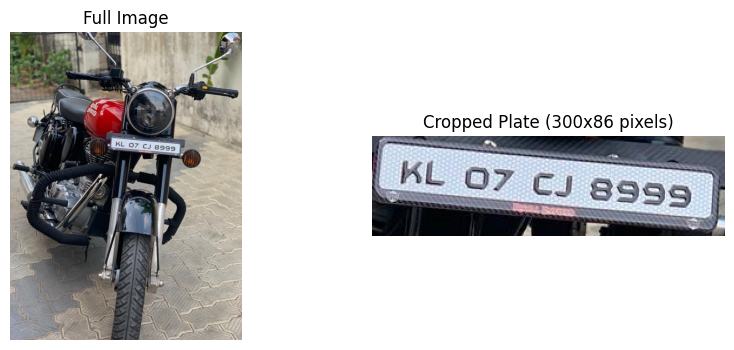

Plate size: 300x86 pixels

✓ OCR SUCCESS!
  Text: KL 07
  Confidence: 0.87
  Text: CJ 8999
  Confidence: 0.90


In [65]:
# Run debug
debug_plate_detection('bike-number-plate-1/train/images/9_jpg.rf.cc6864953f4592c1d295953370e4db1a.jpg')


image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\bike-number-plate-1\train\images\715_jpg.rf.65f5d581b70d99f9cb353d389c21d42f.jpg: 640x480 1 number_plate, 44.8ms
Speed: 3.2ms preprocess, 44.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


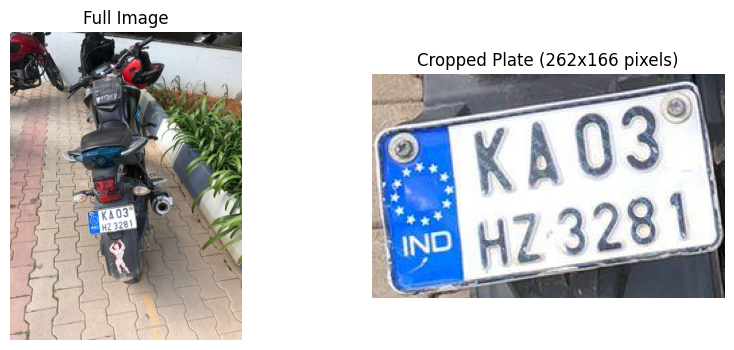

Plate size: 262x166 pixels

✓ OCR SUCCESS!
  Text: KA03
  Confidence: 0.82
  Text: HZ 3281
  Confidence: 0.78
  Text: IND
  Confidence: 1.00


In [67]:
debug_plate_detection('bike-number-plate-1/train/images/715_jpg.rf.65f5d581b70d99f9cb353d389c21d42f.jpg')

It seems to be working with only high res pictures

<h1>Complete pipeline test</h1>

Using CPU. Note: This module is much faster with a GPU.


Processing: test picture.jpeg

🔍 Step 1: Checking for helmet violations...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture.jpeg: 384x640 4 helmets, 2 no-helmets, 69.6ms
Speed: 2.2ms preprocess, 69.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)
  ✓ helmet detected (96.09% confidence)
  ✗ VIOLATION: no-helmet detected (93.14% confidence)
  ✓ helmet detected (83.87% confidence)
  ✓ helmet detected (60.99% confidence)
  ✗ VIOLATION: no-helmet detected (39.53% confidence)
  ✓ helmet detected (32.15% confidence)

🔍 Step 2: Detecting license plate...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture.jpeg: 384x640 1 number_plate, 44.3ms
Speed: 2.0ms preprocess, 44.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)
  ✓ Plate detected at (269, 243, 325, 263)
  Plate size: 56x20 pixels

🔍 Step 3: Reading plate text...
  ✓ P

Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) DejaVu Sans.


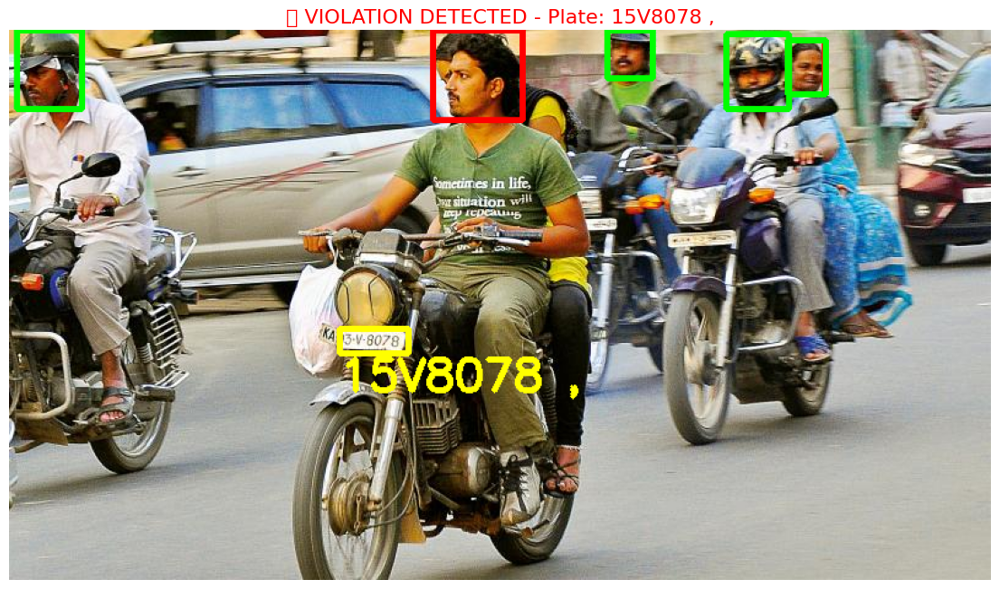


VIOLATION REPORT
Helmet Violation: YES
Plate Detected: True
License Plate: 15V8078 ,
Confidence: 12.03%


In [70]:
from ultralytics import YOLO
import easyocr
import cv2
import matplotlib.pyplot as plt

# Load both models
helmet_model = YOLO('runs/detect/helmet_detector7/weights/best.pt')  # Update path if different
plate_model = YOLO('runs/detect/plate_detector3/weights/best.pt')

# Initialize OCR
reader = easyocr.Reader(['en'], gpu=False)

image_path = 'test picture.jpeg'

def complete_violation_detection(image_path):
    """
    Complete pipeline:
    1. Detect helmet violations
    2. If violation found, detect and read license plate
    """
    
    print(f"Processing: {image_path}\n")
    
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # STEP 1: Helmet Detection
    print("🔍 Step 1: Checking for helmet violations...")
    helmet_results = helmet_model(image_path, device='cpu')
    
    violation_found = False
    helmet_class_names = helmet_model.names  # Get class names
    
    for r in helmet_results:
        boxes = r.boxes
        for box in boxes:
            cls = int(box.cls[0])
            conf = float(box.conf[0])
            class_name = helmet_class_names[cls]
            
            # Check what your classes are named - might be 'no-helmet', 'without-helmet', etc.
            if 'no' in class_name.lower() or 'without' in class_name.lower():
                violation_found = True
                print(f"  ✗ VIOLATION: {class_name} detected ({conf:.2%} confidence)")
                
                # Draw red box
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                cv2.rectangle(img_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 3)
                cv2.putText(img_rgb, f"NO HELMET", (int(x1), int(y1)-10),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
            else:
                print(f"  ✓ {class_name} detected ({conf:.2%} confidence)")
                # Draw green box
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                cv2.rectangle(img_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 3)
    
    if not violation_found:
        print("\n✅ NO VIOLATIONS - Rider is compliant")
        plt.figure(figsize=(12, 8))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.title('✅ Compliant - Helmet Detected')
        plt.show()
        return None
    
    # STEP 2: Plate Detection (only if violation)
    print("\n🔍 Step 2: Detecting license plate...")
    plate_results = plate_model(image_path, device='cpu')
    
    plate_detected = False
    plate_text = None
    plate_confidence = 0
    
    for r in plate_results:
        boxes = r.boxes
        for box in boxes:
            plate_detected = True
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            
            print(f"  ✓ Plate detected at ({x1}, {y1}, {x2}, {y2})")
            
            # Crop plate
            plate_img = img[y1:y2, x1:x2]
            
            print(f"  Plate size: {plate_img.shape[1]}x{plate_img.shape[0]} pixels")
            
            # STEP 3: OCR
            print("\n🔍 Step 3: Reading plate text...")
            
            # Try original
            ocr_result = reader.readtext(plate_img)
            
            if not ocr_result:
                # Try enhanced
                gray = cv2.cvtColor(plate_img, cv2.COLOR_BGR2GRAY)
                enhanced = cv2.equalizeHist(gray)
                ocr_result = reader.readtext(enhanced)
            
            if ocr_result:
                plate_text = ocr_result[0][1]
                plate_confidence = ocr_result[0][2]
                print(f"  ✓ Plate read: {plate_text}")
                print(f"  OCR Confidence: {plate_confidence:.2%}")
                
                # Draw plate box and text
                cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 255, 0), 3)
                cv2.putText(img_rgb, plate_text, (x1, y2+30),
                           cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255, 255, 0), 3)
            else:
                print(f"  ✗ Plate detected but couldn't read text (image quality too low)")
                cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 165, 0), 3)
                cv2.putText(img_rgb, "UNREADABLE", (x1, y2+30),
                           cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 165, 0), 2)
    
    if not plate_detected:
        print("  ✗ No license plate detected in image")
    
    # Display result
    plt.figure(figsize=(14, 10))
    plt.imshow(img_rgb)
    plt.axis('off')
    
    title = "🚨 VIOLATION DETECTED"
    if plate_text:
        title += f" - Plate: {plate_text}"
    elif plate_detected:
        title += " - Plate Unreadable"
    else:
        title += " - No Plate Found"
    
    plt.title(title, fontsize=16, color='red')
    plt.show()
    
    # Return violation info
    return {
        'violation': True,
        'plate_detected': plate_detected,
        'plate_text': plate_text,
        'plate_confidence': plate_confidence
    }

# Test it
result = complete_violation_detection('test picture.jpeg')

if result:
    print("\n" + "="*50)
    print("VIOLATION REPORT")
    print("="*50)
    print(f"Helmet Violation: YES")
    print(f"Plate Detected: {result['plate_detected']}")
    if result['plate_text']:
        print(f"License Plate: {result['plate_text']}")
        print(f"Confidence: {result['plate_confidence']:.2%}")
    else:
        print(f"License Plate: Could not read")
    print("="*50)

Processing: test picture 2.png

🔍 Step 1: Checking for helmet violations...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 2.png: 384x640 3 helmets, 3 no-helmets, 62.2ms
Speed: 2.6ms preprocess, 62.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
  ✓ helmet detected (90.53% confidence)
  ✗ VIOLATION: no-helmet detected (80.17% confidence)
  ✓ helmet detected (72.27% confidence)
  ✓ helmet detected (63.35% confidence)
  ✗ VIOLATION: no-helmet detected (57.70% confidence)
  ✗ VIOLATION: no-helmet detected (37.21% confidence)

🔍 Step 2: Detecting license plate...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 2.png: 384x640 1 number_plate, 46.9ms
Speed: 2.8ms preprocess, 46.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
  ✓ Plate detected at (631, 349, 737, 375)
  Plate size: 106x26 pixels

🔍 Step 3: Reading p

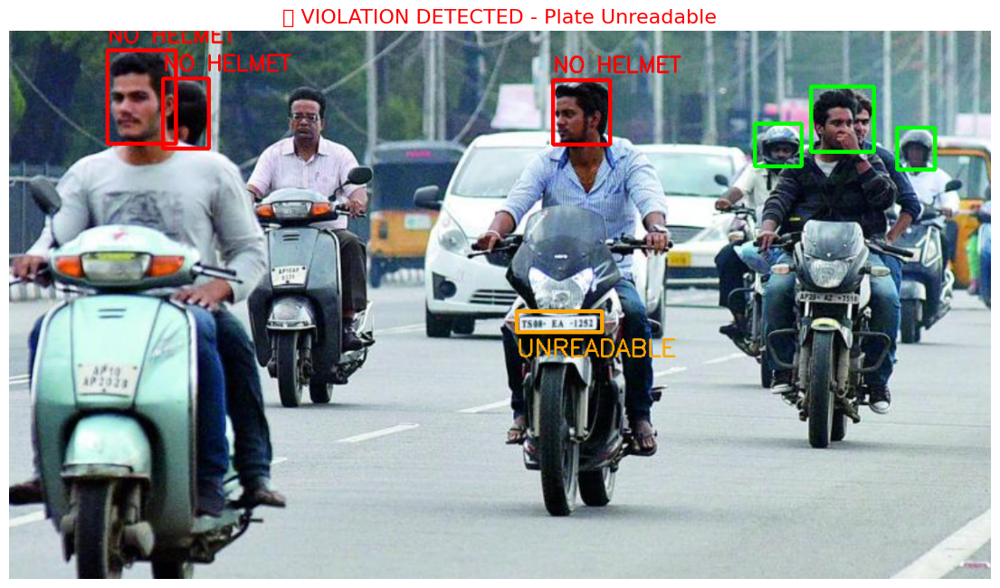


VIOLATION REPORT
Helmet Violation: YES
Plate Detected: True
License Plate: Could not read


In [71]:
result = complete_violation_detection('test picture 2.png')

if result:
    print("\n" + "="*50)
    print("VIOLATION REPORT")
    print("="*50)
    print(f"Helmet Violation: YES")
    print(f"Plate Detected: {result['plate_detected']}")
    if result['plate_text']:
        print(f"License Plate: {result['plate_text']}")
        print(f"Confidence: {result['plate_confidence']:.2%}")
    else:
        print(f"License Plate: Could not read")
    print("="*50)

Processing: test picture 3.jpg

🔍 Step 1: Checking for helmet violations...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 3.jpg: 384x640 1 helmet, 2 no-helmets, 37.3ms
Speed: 1.9ms preprocess, 37.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
  ✗ VIOLATION: no-helmet detected (74.82% confidence)
  ✓ helmet detected (30.16% confidence)
  ✗ VIOLATION: no-helmet detected (25.02% confidence)

🔍 Step 2: Detecting license plate...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 3.jpg: 384x640 1 number_plate, 38.1ms
Speed: 2.0ms preprocess, 38.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
  ✓ Plate detected at (98, 31, 239, 102)
  Plate size: 141x71 pixels

🔍 Step 3: Reading plate text...
  ✓ Plate read: GcNGQ
  OCR Confidence: 8.21%


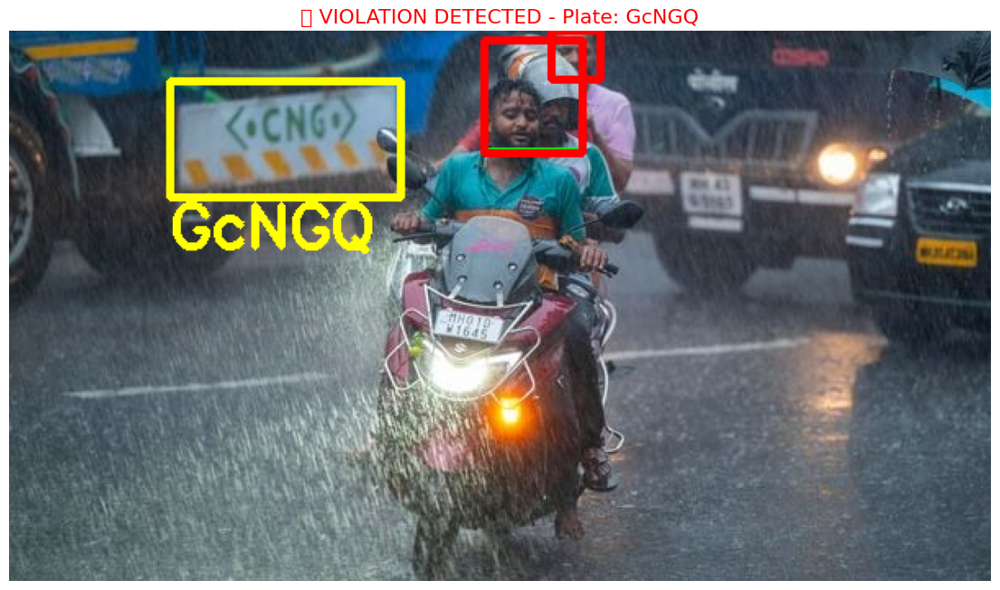


VIOLATION REPORT
Helmet Violation: YES
Plate Detected: True
License Plate: GcNGQ
Confidence: 8.21%


In [72]:
result = complete_violation_detection('test picture 3.jpg')

if result:
    print("\n" + "="*50)
    print("VIOLATION REPORT")
    print("="*50)
    print(f"Helmet Violation: YES")
    print(f"Plate Detected: {result['plate_detected']}")
    if result['plate_text']:
        print(f"License Plate: {result['plate_text']}")
        print(f"Confidence: {result['plate_confidence']:.2%}")
    else:
        print(f"License Plate: Could not read")
    print("="*50)

Processing: test picture 4.jpg

🔍 Step 1: Checking for helmet violations...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 4.jpg: 352x640 4 helmets, 2 no-helmets, 80.4ms
Speed: 2.0ms preprocess, 80.4ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
  ✓ helmet detected (92.69% confidence)
  ✓ helmet detected (79.24% confidence)
  ✓ helmet detected (64.57% confidence)
  ✗ VIOLATION: no-helmet detected (52.40% confidence)
  ✓ helmet detected (37.89% confidence)
  ✗ VIOLATION: no-helmet detected (30.23% confidence)

🔍 Step 2: Detecting license plate...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 4.jpg: 352x640 2 number_plates, 39.5ms
Speed: 2.5ms preprocess, 39.5ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
  ✓ Plate detected at (357, 407, 509, 453)
  Plate size: 152x46 pixels

🔍 Step 3: Reading plate text...


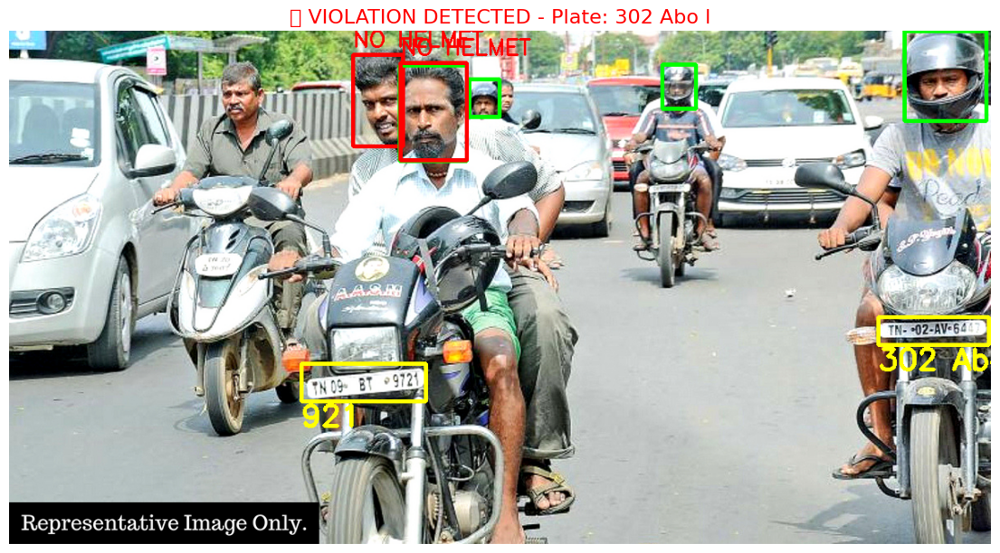


VIOLATION REPORT
Helmet Violation: YES
Plate Detected: True
License Plate: 302 Abo l
Confidence: 1.06%


In [73]:
result = complete_violation_detection('test picture 4.jpg')

if result:
    print("\n" + "="*50)
    print("VIOLATION REPORT")
    print("="*50)
    print(f"Helmet Violation: YES")
    print(f"Plate Detected: {result['plate_detected']}")
    if result['plate_text']:
        print(f"License Plate: {result['plate_text']}")
        print(f"Confidence: {result['plate_confidence']:.2%}")
    else:
        print(f"License Plate: Could not read")
    print("="*50)

<h1>Observations</h1>
<h3>we need to match each person to THEIR bike/plate, not just grab any plate in the image.</h3>
<h3>Solution: Match Person to Nearest Plate Below Them</h3>


Using CPU. Note: This module is much faster with a GPU.


Processing: test picture 4.jpg

🔍 Step 1: Detecting all people...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 4.jpg: 352x640 4 helmets, 2 no-helmets, 115.6ms
Speed: 7.1ms preprocess, 115.6ms inference, 14.6ms postprocess per image at shape (1, 3, 352, 640)
  ✓ Compliant: helmet at (1094, 0, 1194, 110)
  ✓ Compliant: helmet at (798, 41, 839, 95)
  ✓ Compliant: helmet at (562, 59, 599, 105)
  ✗ Violator found: no-helmet at (420, 29, 481, 141)
  ✓ Compliant: helmet at (477, 42, 559, 159)
  ✗ Violator found: no-helmet at (478, 39, 559, 158)

🔍 Step 2: Detecting all license plates in image...

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 4.jpg: 352x640 2 number_plates, 38.7ms
Speed: 2.2ms preprocess, 38.7ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
  Plate detected at (357, 407, 509, 453)
  Plate detected at (1062, 350, 1197, 

C:\Users\alejo\AppData\Roaming\Python\Python310\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


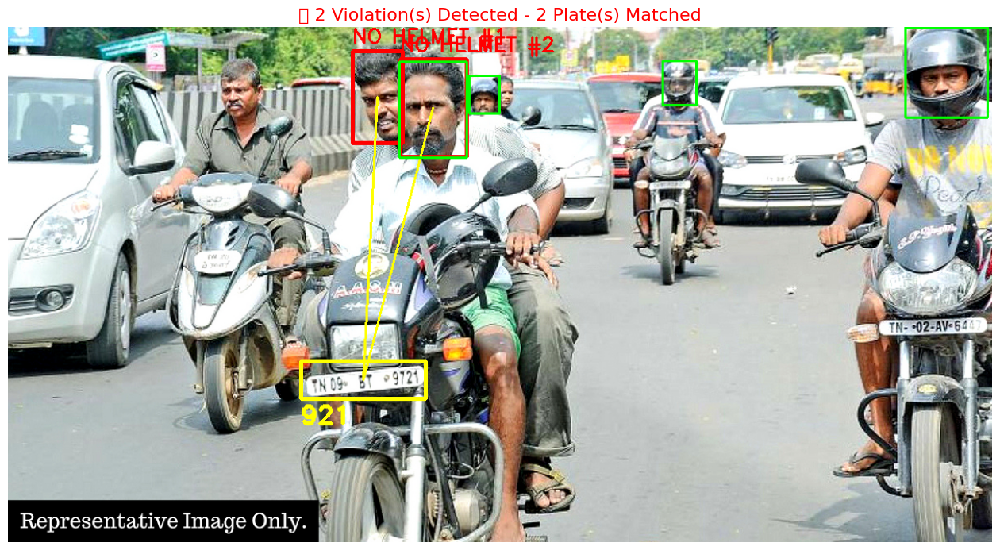


VIOLATION SUMMARY
Violator #1:
  License Plate: 921
  Confidence: 96.82%

Violator #2:
  License Plate: 921
  Confidence: 96.82%



In [ ]:
from ultralytics import YOLO
import easyocr
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the three models we need:
# 1. helmet_model: Detects people with/without helmets
# 2. plate_model: Detects where license plates are in images
# 3. reader: Reads text from license plates (pre-trained OCR)
helmet_model = YOLO('runs/detect/helmet_detector/weights/best.pt')
plate_model = YOLO('runs/detect/plate_detector3/weights/best.pt')
reader = easyocr.Reader(['en'], gpu=False)

def calculate_distance(box1, box2):
    """
    Calculate the distance between the centers of two bounding boxes.
    
    A bounding box is a rectangle defined by 4 numbers: (x1, y1, x2, y2)
    - (x1, y1) = top-left corner coordinates
    - (x2, y2) = bottom-right corner coordinates
    
    We calculate the center point of each box, then find the distance between them.
    This helps us figure out which plate is closest to which person.
    
    Args:
        box1: First bounding box as tuple (x1, y1, x2, y2)
        box2: Second bounding box as tuple (x1, y1, x2, y2)
    
    Returns:
        distance: How far apart the two boxes are (in pixels)
    """
    
    # Calculate the center x-coordinate of the first box
    # Formula: (left edge + right edge) / 2
    x1_center = (box1[0] + box1[2]) / 2
    
    # Calculate the center y-coordinate of the first box
    # Formula: (top edge + bottom edge) / 2
    y1_center = (box1[1] + box1[3]) / 2
    
    # Do the same for the second box
    x2_center = (box2[0] + box2[2]) / 2
    y2_center = (box2[1] + box2[3]) / 2
    
    # Calculate Euclidean distance between the two center points
    # This is the "straight line" distance using Pythagorean theorem
    # Formula: sqrt((x2-x1)² + (y2-y1)²)
    distance = np.sqrt((x2_center - x1_center)**2 + (y2_center - y1_center)**2)
    
    return distance

def is_plate_below_person(person_box, plate_box, threshold=50):
    """
    Check if a license plate is positioned below a person (not above or beside them).
    
    In a typical motorcycle image:
    - The rider's head/body is at the TOP
    - The license plate is at the BOTTOM (on the bike below them)
    
    So we check: Is the plate's TOP edge below the person's BOTTOM edge?
    
    Args:
        person_box: Bounding box of the person (x1, y1, x2, y2)
        plate_box: Bounding box of the license plate (x1, y1, x2, y2)
        threshold: How much overlap we allow (in pixels)
                  Default 50 means plate can start up to 50 pixels above person's bottom
    
    Returns:
        True if plate is below person, False otherwise
    """
    
    # Get the bottom edge of the person's box
    # In image coordinates, y increases downward, so y2 (bottom) > y1 (top)
    person_bottom = person_box[3]
    
    # Get the top edge of the plate's box
    plate_top = plate_box[1]
    
    # Check if plate starts below (or slightly overlapping) the person
    # We subtract threshold to allow some overlap
    # Example: If person ends at y=300 and threshold=50, plate can start at y=250 or higher
    return plate_top > (person_bottom - threshold)

def find_matching_plate(person_box, all_plates):
    """
    Find which license plate belongs to a specific person.
    
    When there are multiple motorcycles in an image, we need to figure out
    which plate belongs to which rider. We do this by:
    1. Only considering plates that are BELOW the person
    2. Only considering plates that are horizontally ALIGNED with the person
    3. Choosing the CLOSEST plate that meets the above criteria
    
    Args:
        person_box: Bounding box of the person without helmet (x1, y1, x2, y2)
        all_plates: List of all plate bounding boxes detected in the image
    
    Returns:
        The bounding box of the matching plate, or None if no match found
    """
    
    # Calculate the horizontal center of the person
    # This helps us check if a plate is roughly "underneath" them
    person_x_center = (person_box[0] + person_box[2]) / 2
    
    # Create an empty list to store plates that are valid candidates
    # We'll fill this with plates that pass our tests
    valid_plates = []
    
    # Loop through each plate that was detected in the image
    for plate_box in all_plates:
        
        # TEST 1: Check if this plate is positioned below the person
        # (Not above or beside them)
        if is_plate_below_person(person_box, plate_box):
            
            # TEST 2: Check horizontal alignment
            # The plate should be roughly under the person, not far to the left or right
            
            # Calculate the horizontal center of this plate
            plate_x_center = (plate_box[0] + plate_box[2]) / 2
            
            # Calculate how far apart they are horizontally (ignore vertical)
            horizontal_distance = abs(plate_x_center - person_x_center)
            
            # Only accept plates that are within 200 pixels horizontally
            # You can adjust this number:
            # - Smaller (e.g., 100) = stricter matching (plate must be directly below)
            # - Larger (e.g., 300) = more lenient matching (plate can be off to the side)
            if horizontal_distance < 200:
                
                # This plate passed both tests! Calculate its total distance from person
                distance = calculate_distance(person_box, plate_box)
                
                # Add this plate to our list of valid candidates
                # Store both the plate's bounding box and its distance
                valid_plates.append({
                    'box': plate_box,
                    'distance': distance
                })
    
    # Now we have a list of all plates that are below and aligned with the person
    # Choose the CLOSEST one (minimum distance)
    if valid_plates:
        # Find the plate with the smallest distance value
        # The 'key' parameter tells min() what to compare (we compare 'distance')
        closest = min(valid_plates, key=lambda x: x['distance'])
        
        # Return the bounding box of the closest plate
        return closest['box']
    
    # If no valid plates were found, return None
    return None

def smart_violation_detection(image_path):
    """
    Complete intelligent violation detection pipeline.
    
    This function does everything:
    1. Detects all people in the image (with and without helmets)
    2. Detects all license plates in the image
    3. Matches each person without a helmet to THEIR specific plate
    4. Reads the text from each matched plate using OCR
    5. Displays the results with visual annotations
    6. Returns a report of all violations
    
    The key intelligence is in STEP 3 - we don't just grab any plate,
    we figure out which plate belongs to which person!
    
    Args:
        image_path: Path to the image file to analyze
    
    Returns:
        List of violation reports, each containing:
        - violator_id: Which violator this is (1, 2, 3, etc.)
        - plate: The license plate text (or None if unreadable)
        - plate_confidence: How confident the OCR is (0-1)
        - person_box: Where the person is in the image
        - plate_box: Where their plate is in the image
    """
    
    # Print what we're doing (helpful for debugging)
    print(f"Processing: {image_path}\n")
    
    # Read the image file from disk
    # cv2.imread loads it as a numpy array (a grid of pixel values)
    img = cv2.imread(image_path)
    
    # Convert from BGR (OpenCV's format) to RGB (normal format for display)
    # OpenCV uses BGR (Blue-Green-Red) but matplotlib uses RGB (Red-Green-Blue)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # ========================================================================
    # STEP 1: Detect ALL people (both with and without helmets)
    # ========================================================================
    
    print("🔍 Step 1: Detecting all people...")
    
    # Run the helmet detection model on the image
    # device='cpu' means use the computer's processor (not GPU)
    # This returns a list of detections (bounding boxes + classes)
    helmet_results = helmet_model(image_path, device='cpu')
    
    # Create two empty lists to separate people into categories:
    violators = []   # People WITHOUT helmets (violations)
    compliant = []   # People WITH helmets (following the rules)
    
    # Get the class names from the model
    # This is a dictionary like {0: 'helmet', 1: 'no-helmet'}
    # It tells us what each class number means
    helmet_class_names = helmet_model.names
    
    # Loop through all the detection results
    # 'r' is each result object from the model
    for r in helmet_results:
        
        # Get all the bounding boxes from this result
        boxes = r.boxes
        
        # Loop through each detected box (each person found)
        for box in boxes:
            
            # Extract information from this detection:
            
            # cls = class ID (a number like 0 or 1)
            cls = int(box.cls[0])
            
            # conf = confidence score (how sure the model is, 0-1)
            conf = float(box.conf[0])
            
            # class_name = the actual name of the class (like 'helmet' or 'no-helmet')
            class_name = helmet_class_names[cls]
            
            # Get the bounding box coordinates
            # xyxy format means: x1, y1 (top-left) and x2, y2 (bottom-right)
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            
            # Convert coordinates to integers (they come as floats)
            # Store as a tuple: (x1, y1, x2, y2)
            bbox = (int(x1), int(y1), int(x2), int(y2))
            
            # Now categorize this person based on their class name
            # Check if the class name contains 'no' or 'without' (means no helmet)
            # .lower() converts to lowercase so it matches 'No', 'NO', 'no', etc.
            if 'no' in class_name.lower() or 'without' in class_name.lower():
                
                # This person is NOT wearing a helmet - it's a violation!
                # Add them to the violators list with all their info
                violators.append({
                    'bbox': bbox,              # Where they are in the image
                    'confidence': conf,        # How confident the detection is
                    'class': class_name        # What class they are
                })
                
                # Print this finding
                print(f"  ✗ Violator found: {class_name} at {bbox}")
                
            else:
                # This person IS wearing a helmet - they're compliant!
                # Add them to the compliant list
                compliant.append({
                    'bbox': bbox,
                    'confidence': conf,
                    'class': class_name
                })
                
                # Print this finding
                print(f"  ✓ Compliant: {class_name} at {bbox}")
    
    # Check if we found any violators
    # If the violators list is empty, everyone is compliant!
    if not violators:
        print("\n✅ NO VIOLATIONS - All riders compliant")
        
        # Draw green boxes around all the compliant people to show them
        for person in compliant:
            # Get their bounding box coordinates
            x1, y1, x2, y2 = person['bbox']
            
            # Draw a green rectangle on the image
            # Parameters: image, top-left corner, bottom-right corner, color (RGB), thickness
            cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 3)
            
            # Add text label above the box
            # Parameters: image, text, position, font, size, color, thickness
            cv2.putText(img_rgb, "HELMET OK", (x1, y1-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        
        # Display the image with annotations
        plt.figure(figsize=(14, 10))  # Set size of the display window
        plt.imshow(img_rgb)            # Show the image
        plt.axis('off')                # Hide the axis numbers
        plt.title('✅ All Riders Compliant')  # Add a title
        plt.show()                     # Actually display it
        
        # Return None because there are no violations to report
        return None
    
    # If we get here, we found at least one violator!
    # Continue with the rest of the pipeline...
    
    # ========================================================================
    # STEP 2: Detect ALL license plates in the image
    # ========================================================================
    
    print(f"\n🔍 Step 2: Detecting all license plates in image...")
    
    # Run the plate detection model on the image
    # This finds ALL plates, regardless of which person they belong to
    plate_results = plate_model(image_path, device='cpu')
    
    # Create an empty list to store all the plate bounding boxes
    all_plates = []
    
    # Loop through the detection results
    for r in plate_results:
        # Get all detected boxes
        boxes = r.boxes
        
        # Loop through each detected plate
        for box in boxes:
            # Get the bounding box coordinates
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            
            # Convert to integers and store as tuple
            bbox = (int(x1), int(y1), int(x2), int(y2))
            
            # Add this plate's bounding box to our list
            all_plates.append(bbox)
            
            # Print where we found it
            print(f"  Plate detected at {bbox}")
    
    # Print how many total plates we found
    print(f"  Total plates found: {len(all_plates)}")
    
    # ========================================================================
    # STEP 3: Match each violator to THEIR specific plate
    # ========================================================================
    # This is the smart part that solves the original problem!
    
    print(f"\n🔍 Step 3: Matching violators to their plates...")
    
    # Create an empty list to store complete violation reports
    # Each report will have the person info + their plate info
    violation_reports = []
    
    # Loop through each violator we found
    # enumerate() gives us both the index (i) and the violator data
    # We start counting from 1 (not 0) to make it more user-friendly
    for i, violator in enumerate(violators, 1):
        
        print(f"\n  Violator #{i}:")
        print(f"    Position: {violator['bbox']}")
        
        # Find which plate belongs to THIS specific violator
        # This calls our smart matching function
        # It returns the plate box, or None if no match found
        matching_plate = find_matching_plate(violator['bbox'], all_plates)
        
        # Check if we found a matching plate
        if matching_plate:
            # Success! We found their plate
            print(f"    ✓ Matched to plate at: {matching_plate}")
            
            # Extract the plate region from the image for OCR
            # matching_plate is (x1, y1, x2, y2)
            x1, y1, x2, y2 = matching_plate
            
            # Crop the image to just the plate region
            # Array slicing: img[y1:y2, x1:x2] gets the rectangle
            plate_img = img[y1:y2, x1:x2]
            
            # ================================================================
            # OCR (Optical Character Recognition) - Read the plate text
            # ================================================================
            
            # Try to read text from the plate image
            # readtext() returns a list of detections, each with:
            # [bounding_box, text, confidence]
            ocr_result = reader.readtext(plate_img)
            
            # Check if OCR found anything
            if not ocr_result:
                # OCR failed on original image, try enhancing it
                
                # Convert to grayscale (sometimes helps OCR)
                gray = cv2.cvtColor(plate_img, cv2.COLOR_BGR2GRAY)
                
                # Enhance contrast using histogram equalization
                # This makes dark pixels darker and bright pixels brighter
                enhanced = cv2.equalizeHist(gray)
                
                # Try OCR again on the enhanced image
                ocr_result = reader.readtext(enhanced)
            
            # Initialize variables to store the plate text
            plate_text = None
            plate_conf = 0
            
            # Check if OCR succeeded (found any text)
            if ocr_result:
                # OCR returns a list, we take the first result
                # ocr_result[0] is a tuple: (bbox, text, confidence)
                
                # Extract the text (index 1)
                plate_text = ocr_result[0][1]
                
                # Extract the confidence score (index 2)
                plate_conf = ocr_result[0][2]
                
                # Print success message
                print(f"    ✓ Plate read: {plate_text} ({plate_conf:.2%} confidence)")
            else:
                # OCR failed even after enhancement
                print(f"    ✗ Plate unreadable (poor quality)")
            
            # ================================================================
            # Draw annotations on the image to visualize the results
            # ================================================================
            
            # Draw RED box around the violator (person without helmet)
            vx1, vy1, vx2, vy2 = violator['bbox']
            cv2.rectangle(img_rgb, (vx1, vy1), (vx2, vy2), (255, 0, 0), 3)
            
            # Add text label for the violator
            cv2.putText(img_rgb, f"NO HELMET #{i}", (vx1, vy1-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
            
            # Draw YELLOW box around their matched license plate
            cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 255, 0), 3)
            
            # Draw a line connecting the person to their plate
            # This makes it visually clear which plate belongs to which person
            
            # Calculate center point of person's box
            person_center = ((vx1 + vx2) // 2, (vy1 + vy2) // 2)
            
            # Calculate center point of plate's box
            plate_center = ((x1 + x2) // 2, (y1 + y2) // 2)
            
            # Draw yellow line connecting the two centers
            cv2.line(img_rgb, person_center, plate_center, (255, 255, 0), 2)
            
            # Add the plate text below the plate box
            if plate_text:
                # If we successfully read the plate, show the text
                cv2.putText(img_rgb, plate_text, (x1, y2+30),
                           cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 0), 3)
            else:
                # If we couldn't read it, show "UNREADABLE"
                cv2.putText(img_rgb, "UNREADABLE", (x1, y2+30),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 165, 0), 2)
            
            # Add this violation to our report list
            violation_reports.append({
                'violator_id': i,                    # Which violator (1, 2, 3, etc.)
                'plate': plate_text,                 # The plate text (or None)
                'plate_confidence': plate_conf,      # OCR confidence (0-1)
                'person_box': violator['bbox'],      # Where the person is
                'plate_box': matching_plate          # Where their plate is
            })
            
        else:
            # No matching plate found for this violator
            # Maybe their plate is obscured by another bike, or not visible in frame
            print(f"    ✗ No matching plate found (obscured or not visible)")
            
            # Still draw a red box around the violator to show them
            vx1, vy1, vx2, vy2 = violator['bbox']
            cv2.rectangle(img_rgb, (vx1, vy1), (vx2, vy2), (255, 0, 0), 3)
            
            # Add text explaini


image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 4.jpg: 352x640 4 helmets, 2 no-helmets, 78.4ms
Speed: 4.9ms preprocess, 78.4ms inference, 4.3ms postprocess per image at shape (1, 3, 352, 640)

image 1/1 c:\Users\alejo\Downloads\universidad\programming for modedrn machine learning\proyecto final\test picture 4.jpg: 352x640 2 number_plates, 52.2ms
Speed: 2.1ms preprocess, 52.2ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)


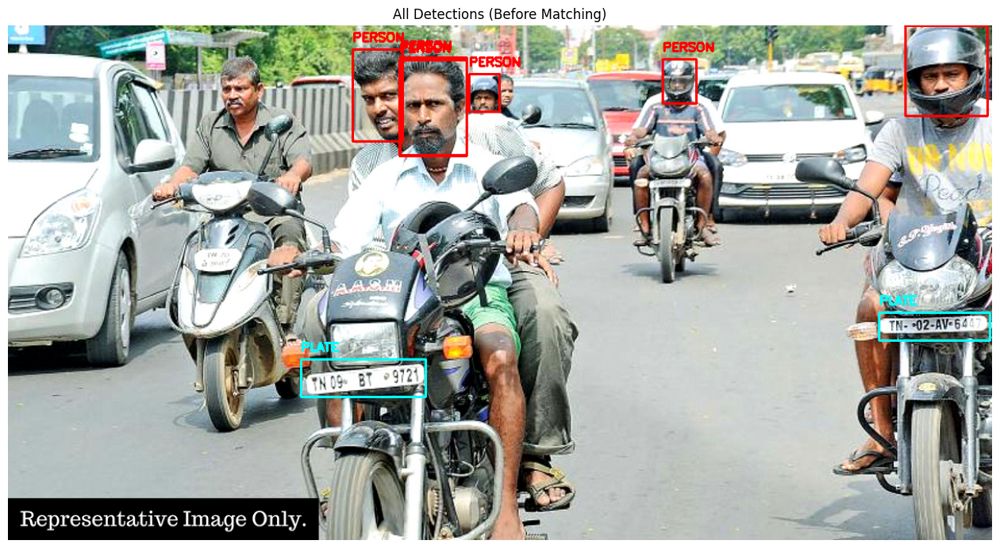

In [5]:
# See all detections with spatial relationships
def visualize_all_detections(image_path):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Detect people
    helmet_results = helmet_model(image_path, device='cpu')
    # Detect plates
    plate_results = plate_model(image_path, device='cpu')
    
    # Draw all people
    for r in helmet_results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            cv2.rectangle(img_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)
            cv2.putText(img_rgb, "PERSON", (int(x1), int(y1)-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    
    # Draw all plates
    for r in plate_results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            cv2.rectangle(img_rgb, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 255), 2)
            cv2.putText(img_rgb, "PLATE", (int(x1), int(y1)-10),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)
    
    plt.figure(figsize=(16, 12))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title('All Detections (Before Matching)')
    plt.show()

# Use this to debug if matching isn't working
visualize_all_detections('test picture 4.jpg')